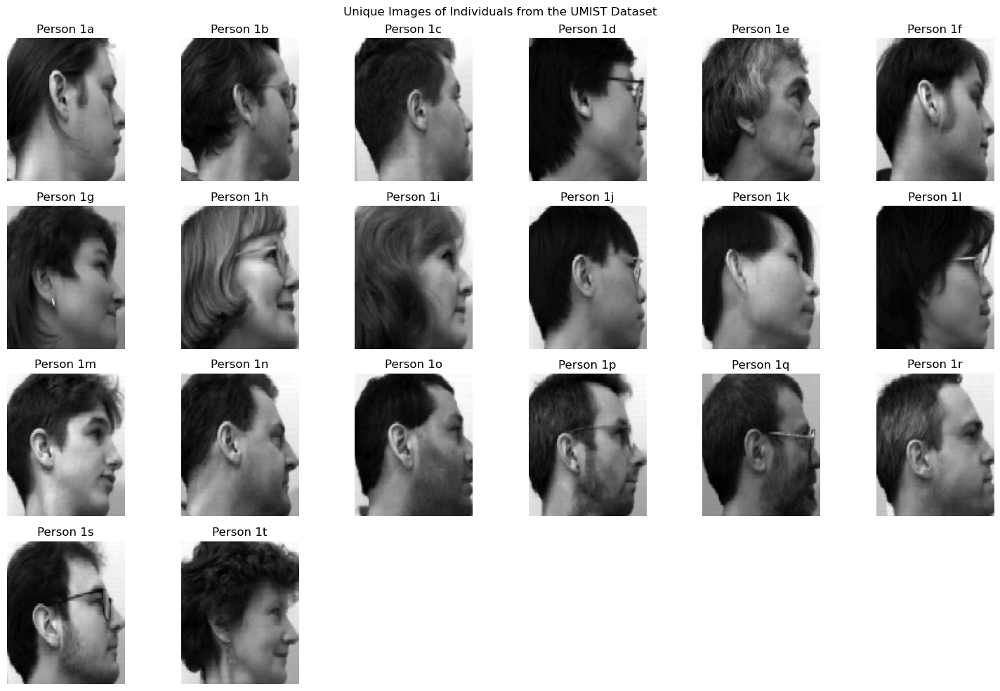

In [2]:
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image

df = pd.read_csv('../Dataset/umist_faces.csv')


unique_labels = df['label'].unique()

image_height, image_width = 112, 92

plt.figure(figsize=(15, 10))
for i, label in enumerate(unique_labels):
    person_image = df[df['label'] == label].iloc[0, 1:].values.astype(float).reshape(image_height, image_width)
    
    plt.subplot(4, 6, i + 1)
    plt.imshow(person_image, cmap='gray')
    plt.axis('off')
    plt.title(f"Person {label}")

plt.suptitle("Unique Images of Individuals from the UMIST Dataset")
plt.tight_layout()
plt.show()

In [3]:
duplicates = df.duplicated()
num_duplicates = duplicates.sum()

duplicates = df[duplicates]


if not duplicates.empty:
    print(f"Found {len(duplicates)} duplicate rows:")
    print(duplicates)
else:
    print("No duplicate rows found in the DataFrame.")

Found 10 duplicate rows:
   label  pixel_0  pixel_1  pixel_2  pixel_3  pixel_4  pixel_5  pixel_6  \
63    1b    230.0    230.0    232.0    230.0    233.0    232.0    232.0   
64    1b    233.0    232.0    233.0    232.0    233.0    234.0    230.0   
65    1b    234.0    233.0    234.0    234.0    234.0    233.0    234.0   
66    1b    233.0    233.0    234.0    233.0    233.0    234.0    234.0   
67    1b    234.0    233.0    234.0    234.0    234.0    233.0    234.0   
68    1b    234.0    233.0    234.0    234.0    234.0    234.0    234.0   
69    1b    234.0    234.0    233.0    234.0    233.0    234.0    233.0   
70    1b    234.0    234.0    234.0    234.0    234.0    234.0    234.0   
71    1b    234.0    234.0    234.0    234.0    234.0    234.0    232.0   
72    1b    221.0    209.0    140.0     86.0     83.0     74.0     66.0   

    pixel_7  pixel_8  ...  pixel_10294  pixel_10295  pixel_10296  pixel_10297  \
63    232.0    229.0  ...        113.0        122.0        127.0    

In [4]:
if num_duplicates > 0:
    df = df.drop_duplicates()
    print(f"Duplicates removed. New dataset shape: {df.shape}")
else:
    print("No duplicates found in the dataset.")

Duplicates removed. New dataset shape: (565, 10305)


In [5]:
missing_values = df.isnull().sum().sum()
if missing_values > 0:
    print(f"Dataset contains {missing_values} missing values. Cleaning is required.")
    df = df.dropna()
else:
    print("No missing values found in the dataset.")

No missing values found in the dataset.


Label distribution:
 label
1s    48
1a    38
1l    34
1k    34
1t    34
1r    33
1j    32
1n    30
1e    26
1m    26
1p    26
1q    26
1c    26
1b    25
1d    24
1f    23
1h    22
1i    20
1g    19
1o    19
Name: count, dtype: int64


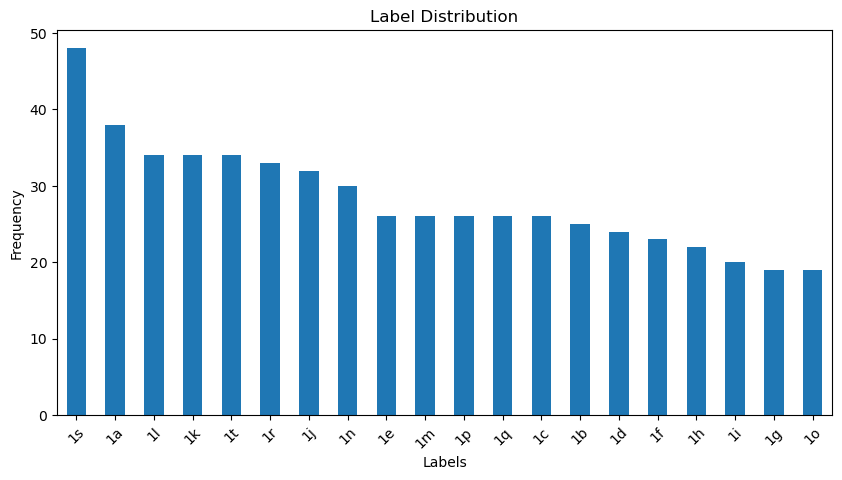

In [6]:
# Check for label distribution
label_counts = df['label'].value_counts()
print("Label distribution:\n", label_counts)

# Plot the distribution
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
label_counts.plot(kind='bar')
plt.title("Label Distribution")
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()


Balanced dataset shape: (960, 112, 92, 1)
Label distribution after augmentation: (array(['1a', '1b', '1c', '1d', '1e', '1f', '1g', '1h', '1i', '1j', '1k',
       '1l', '1m', '1n', '1o', '1p', '1q', '1r', '1s', '1t'], dtype='<U2'), array([48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48,
       48, 48, 48], dtype=int64))


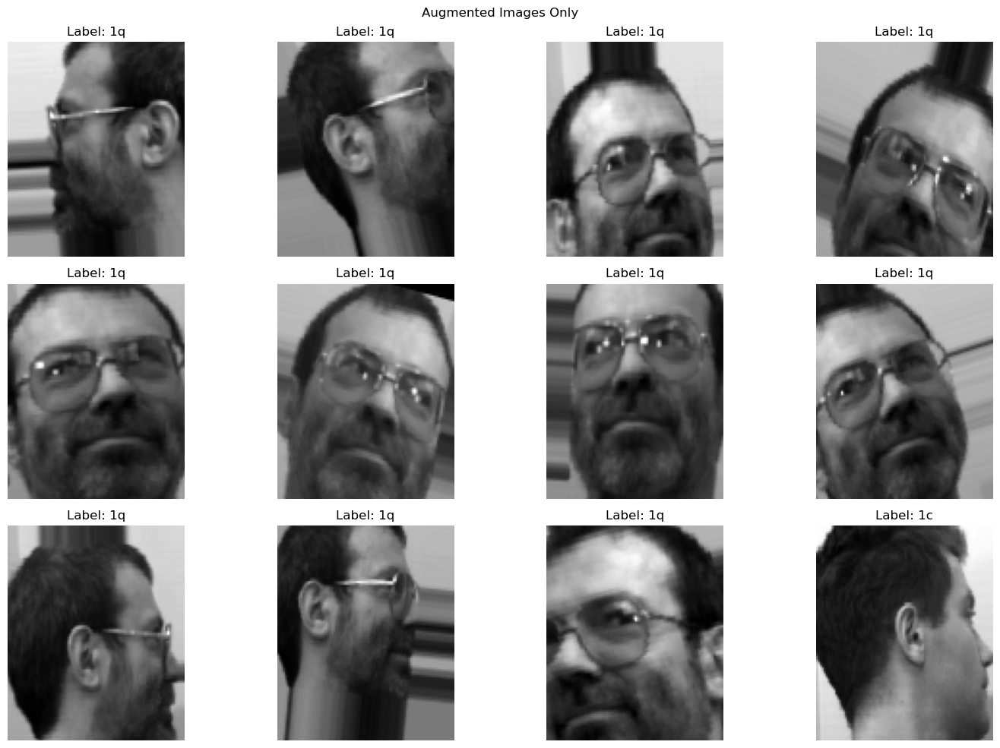

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt

# Data augmentation generator setup
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Convert the dataset into a format suitable for augmentation
image_height, image_width = 112, 92
X = df.iloc[:, 1:].values.reshape(-1, image_height, image_width, 1).astype(float)  # Shape to (samples, height, width, channels)
y = df['label'].values

# Determine maximum class count
label_counts = df['label'].value_counts()
max_count = label_counts.max()

# Augment and balance dataset
balanced_images = []
balanced_labels = []

for label in label_counts.index:
    class_images = X[y == label]  # Select images for the current class
    class_labels = y[y == label]  # Select labels for the current class
    
    # Add existing images
    balanced_images.extend(class_images)  # Add existing images
    balanced_labels.extend(class_labels)  # Add corresponding labels
    
    # Augment images for minority classes
    if len(class_images) < max_count:
        total_needed = max_count - len(class_images)
        
        # Generate augmented images
        for i, batch in enumerate(datagen.flow(class_images, batch_size=1)):
            balanced_images.append(batch[0])  # Add augmented image
            balanced_labels.append(label)  # Add corresponding label
            if i + 1 >= total_needed:  # Stop when enough samples are generated
                break

balanced_images = np.array(balanced_images)
balanced_labels = np.array(balanced_labels)

print("Balanced dataset shape:", balanced_images.shape)
print("Label distribution after augmentation:", np.unique(balanced_labels, return_counts=True))

augmented_start_index = len(X)  
plt.figure(figsize=(15, 10))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.imshow(balanced_images[augmented_start_index + i].reshape(image_height, image_width), cmap='gray')
    plt.axis('off')
    plt.title(f"Label: {balanced_labels[augmented_start_index + i]}")
plt.suptitle("Augmented Images Only")
plt.tight_layout()
plt.show()


In [17]:
from sklearn.model_selection import train_test_split

# Normalize images (if not already done)
balanced_images = balanced_images.astype(np.float32) / 255.0

# Perform train-test-validation split
X_train, X_temp, y_train, y_temp = train_test_split(
    balanced_images, balanced_labels, test_size=0.4, stratify=balanced_labels, random_state=42
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42
)

# Verify the splits
print(f"Training set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")
print(f"Testing set: {X_test.shape}, {y_test.shape}")


Training set: (576, 112, 92, 1), (576,)
Validation set: (192, 112, 92, 1), (192,)
Testing set: (192, 112, 92, 1), (192,)


In [18]:
def label_distribution(labels, set_name):
    unique, counts = np.unique(labels, return_counts=True)
    print(f"{set_name} label distribution: {dict(zip(unique, counts))}")

# Check label distributions for train, validation, and test sets
label_distribution(y_train, "Train")
label_distribution(y_val, "Validation")
label_distribution(y_test, "Test")


Train label distribution: {'1a': 29, '1b': 29, '1c': 29, '1d': 29, '1e': 29, '1f': 29, '1g': 28, '1h': 28, '1i': 29, '1j': 29, '1k': 28, '1l': 29, '1m': 29, '1n': 29, '1o': 28, '1p': 29, '1q': 29, '1r': 29, '1s': 29, '1t': 29}
Validation label distribution: {'1a': 10, '1b': 10, '1c': 9, '1d': 9, '1e': 9, '1f': 10, '1g': 10, '1h': 10, '1i': 9, '1j': 9, '1k': 10, '1l': 10, '1m': 10, '1n': 9, '1o': 10, '1p': 10, '1q': 9, '1r': 10, '1s': 10, '1t': 9}
Test label distribution: {'1a': 9, '1b': 9, '1c': 10, '1d': 10, '1e': 10, '1f': 9, '1g': 10, '1h': 10, '1i': 10, '1j': 10, '1k': 10, '1l': 9, '1m': 9, '1n': 10, '1o': 10, '1p': 9, '1q': 10, '1r': 9, '1s': 9, '1t': 10}


In [35]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_cnn_model(input_shape=(112, 92, 1), embedding_dim=128):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Conv2D(64, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Conv2D(128, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(embedding_dim, activation=None)
    ])
    return model


In [36]:
embedding_dim = 128 
input_shape = (112, 92, 1)  
cnn_model = create_cnn_model(input_shape, embedding_dim)

cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 112, 92, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 56, 46, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 46, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 28, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 19712)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     5,046,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,172,096 (19.73 MB)

 Trainable params: 5,172,096 (19.73 MB)

 Non-trainable params: 0 (0.00 B)

In [38]:
train_images = X_train[..., np.newaxis]
val_images = X_val[..., np.newaxis]
test_images = X_test[..., np.newaxis]

train_images.shape

(576, 112, 92, 1, 1)

In [39]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(y_train)
val_labels_encoded = label_encoder.transform(y_val)
test_labels_encoded = label_encoder.transform(y_test)

print(f"Train Images Shape: {train_images.shape}")
print(f"Validation Images Shape: {val_images.shape}")
print(f"Test Images Shape: {test_images.shape}")

Train Images Shape: (576, 112, 92, 1, 1)
Validation Images Shape: (192, 112, 92, 1, 1)
Test Images Shape: (192, 112, 92, 1, 1)


In [40]:
from tensorflow.keras import optimizers

# Add classification head
classification_model = models.Sequential([
    cnn_model,
    layers.Dense(len(unique_labels), activation='softmax')
])

# Compile the model
classification_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = classification_model.fit(
    train_images, train_labels_encoded,
    validation_data=(val_images, val_labels_encoded),
    epochs=10,
    batch_size=32
)

Epoch 1/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 285ms/step - accuracy: 0.0691 - loss: 2.9880 - val_accuracy: 0.1562 - val_loss: 2.8225
Epoch 2/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 218ms/step - accuracy: 0.2521 - loss: 2.5533 - val_accuracy: 0.4740 - val_loss: 1.8573
Epoch 3/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - accuracy: 0.6122 - loss: 1.3179 - val_accuracy: 0.5885 - val_loss: 1.4740
Epoch 4/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 235ms/step - accuracy: 0.8302 - loss: 0.6589 - val_accuracy: 0.6302 - val_loss: 1.4383
Epoch 5/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - accuracy: 0.9223 - loss: 0.3093 - val_accuracy: 0.6875 - val_loss: 1.6652
Epoch 6/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - accuracy: 0.9498 - loss: 0.1470 - val_accuracy: 0.7031 - val_loss: 1.4290
Epoch 7/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step - accuracy: 0.9735 - loss: 0.0723 - val_accuracy: 0.6458 - val_loss: 2.0679
Epoch 8/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - accuracy: 0.9922 - loss: 0.0251 - val_accuracy: 0.

In [41]:
feature_extractor = cnn_model

train_embeddings = feature_extractor.predict(train_images)
val_embeddings = feature_extractor.predict(val_images)
test_embeddings = feature_extractor.predict(test_images)

print(f"Train Embeddings Shape: {train_embeddings.shape}")
print(f"Validation Embeddings Shape: {val_embeddings.shape}")
print(f"Test Embeddings Shape: {test_embeddings.shape}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Train Embeddings Shape: (576, 128)
Validation Embeddings Shape: (192, 128)
Test Embeddings Shape: (192, 128)


In [42]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

num_clusters = len(unique_labels)
kmeans = KMeans(n_clusters=num_clusters, random_state=32)
cluster_labels = kmeans.fit_predict(train_embeddings)

silhouette_avg = silhouette_score(train_embeddings, cluster_labels)
print(f"Silhouette Score: {silhouette_avg:.4f}")

c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score: 0.2665


In [43]:
def find_optimal_clusters(embeddings, max_clusters=10):
    silhouette_avgs = []
    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=32)
        cluster_labels = kmeans.fit_predict(embeddings)
        silhouette_avg = silhouette_score(embeddings, cluster_labels)
        silhouette_avgs.append((n_clusters, silhouette_avg))
    return silhouette_avgs

max_clusters = 50
silhouette_avgs = find_optimal_clusters(train_embeddings, max_clusters=max_clusters)


c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\sagar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

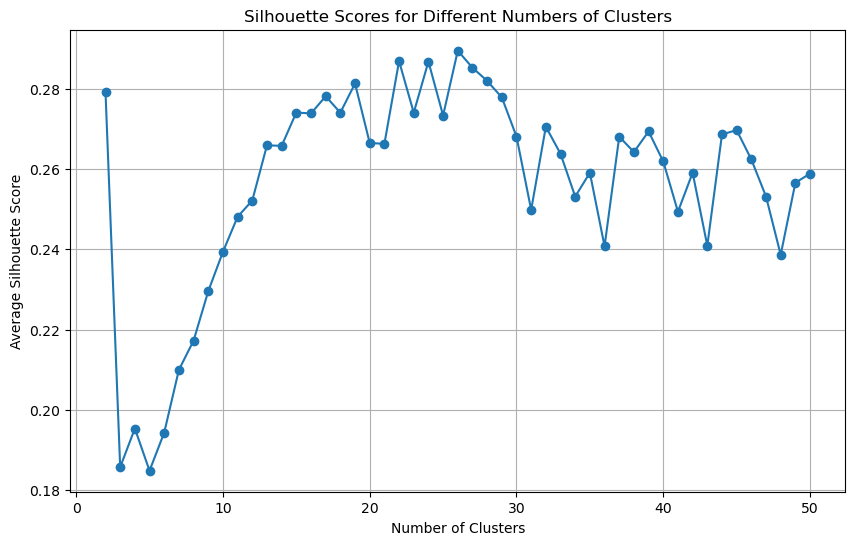

The optimal number of clusters is 26 with a silhouette score of 0.2895.


In [44]:
clusters, scores = zip(*silhouette_avgs)
plt.figure(figsize=(10, 6))
plt.plot(clusters, scores, marker='o')
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Average Silhouette Score")
plt.grid(True)
plt.show()

# Find and print the optimal number of clusters
optimal_clusters = clusters[np.argmax(scores)]
print(f"The optimal number of clusters is {optimal_clusters} with a silhouette score of {max(scores):.4f}.")

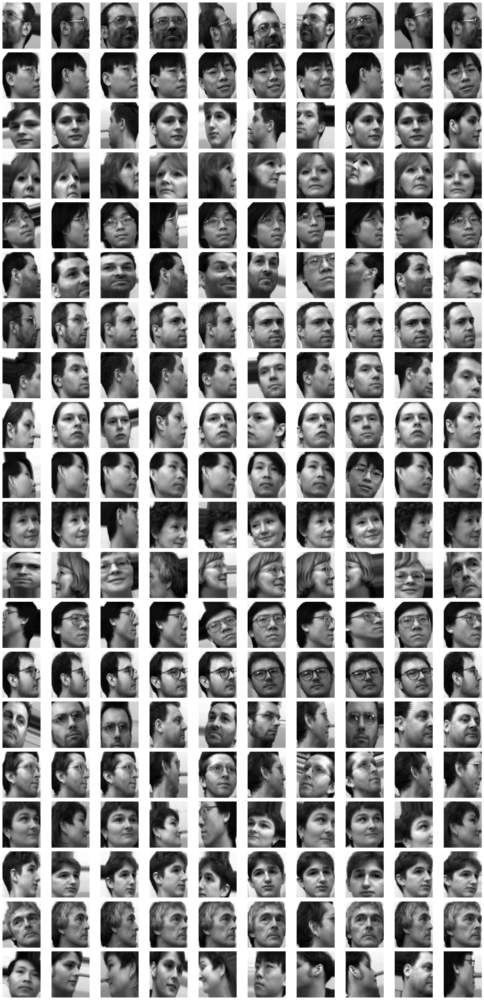

In [46]:
def group_images_by_cluster(images, cluster_labels):
    clusters = {}
    for idx, cluster in enumerate(cluster_labels):
        if cluster not in clusters:
            clusters[cluster] = []
        # Ensure images have the correct shape for visualization
        clusters[cluster].append(images[idx].squeeze())  
    return clusters

# Group images by cluster
clusters = group_images_by_cluster(X_train, cluster_labels)  # Assuming `X_train` contains train images

def plot_clusters(clusters, images_per_cluster=10):
    num_clusters = len(clusters)
    
    # Create a figure with a grid of subplots
    fig, axes = plt.subplots(num_clusters, images_per_cluster, 
                             figsize=(images_per_cluster * 2, num_clusters * 2))
    if num_clusters == 1:  # Special handling for a single cluster
        axes = np.expand_dims(axes, axis=0)

    for cluster_id, image_list in clusters.items():
        for i in range(min(len(image_list), images_per_cluster)):
            ax = axes[cluster_id, i]
            ax.imshow(image_list[i], cmap='gray')
            ax.axis('off')
        # Turn off extra axes in the row
        for j in range(len(image_list), images_per_cluster):
            ax = axes[cluster_id, j]
            ax.axis('off')
    plt.tight_layout()
    plt.show()

# Plot the clusters
plot_clusters(clusters, images_per_cluster=10)


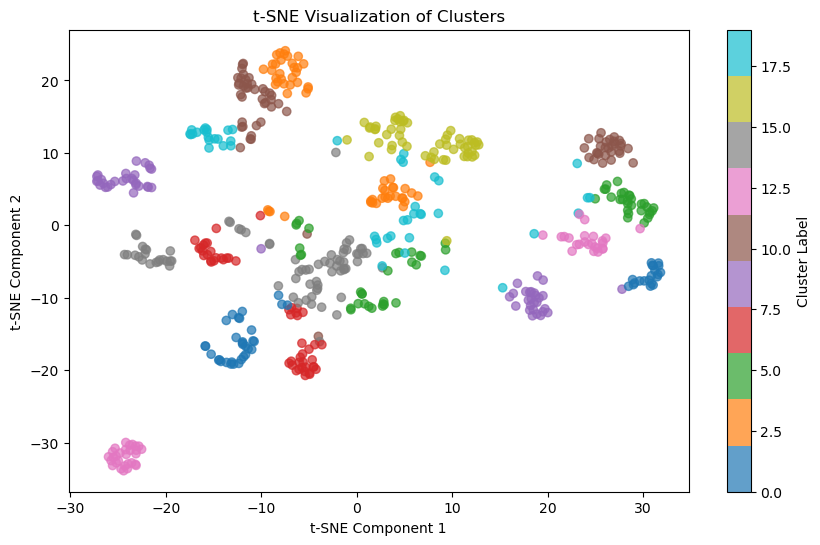

In [47]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=32)
tsne_embeddings = tsne.fit_transform(train_embeddings)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    tsne_embeddings[:, 0],
    tsne_embeddings[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
)
plt.colorbar(scatter, label="Cluster Label")
plt.title("t-SNE Visualization of Clusters")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


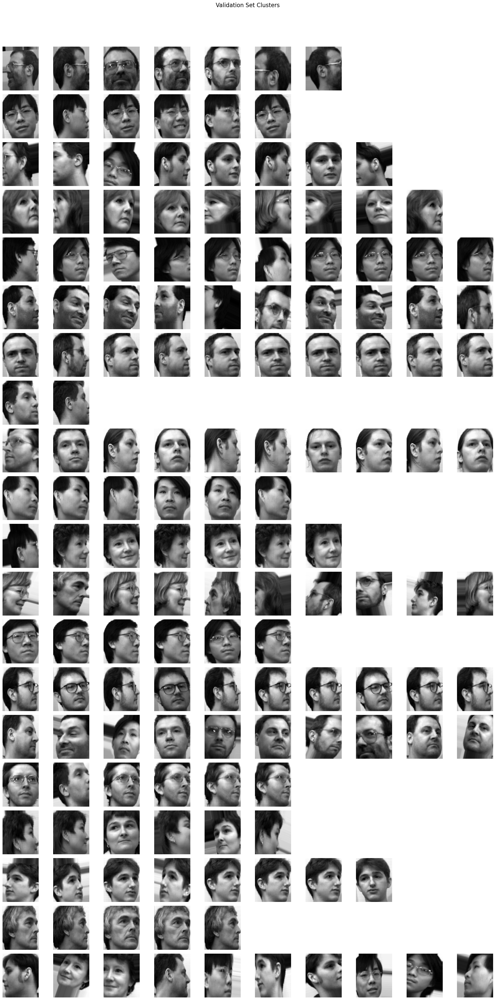

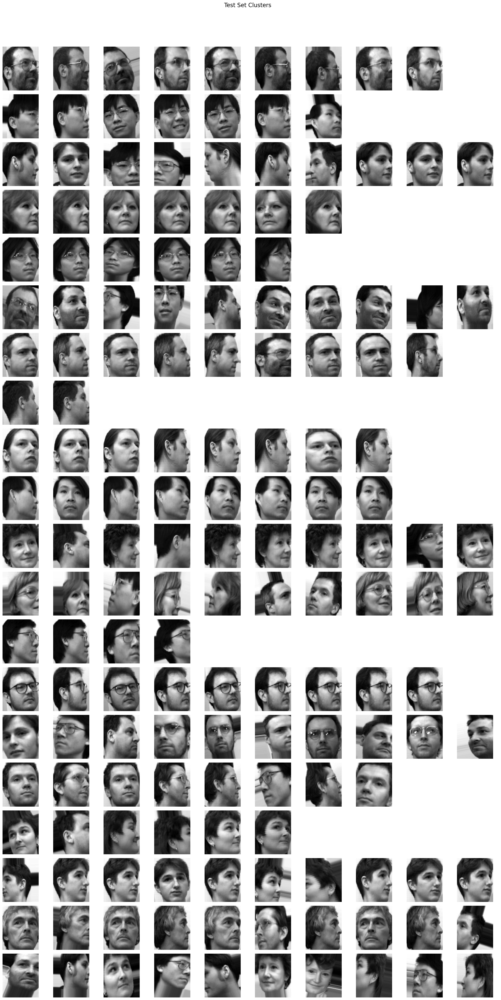

In [48]:
# Group images by cluster
def group_images_by_cluster(images, cluster_labels):
    clusters = {}
    for idx, cluster in enumerate(cluster_labels):
        if cluster not in clusters:
            clusters[cluster] = []
        clusters[cluster].append(images[idx])
    return clusters

def plot_clusters_with_title(clusters, images_per_cluster=10, title="Cluster Visualization"):
    num_clusters = len(clusters)
    fig, axes = plt.subplots(num_clusters, images_per_cluster, figsize=(images_per_cluster * 2, num_clusters * 2))
    for cluster_id, image_list in clusters.items():
        for i in range(min(len(image_list), images_per_cluster)):
            ax = axes[cluster_id, i] if num_clusters > 1 else axes[i]
            ax.imshow(image_list[i].squeeze(), cmap='gray')
            ax.axis('off')
        for j in range(len(image_list), images_per_cluster):
            ax = axes[cluster_id, j] if num_clusters > 1 else axes[j]
            ax.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

val_cluster_labels = kmeans.predict(val_embeddings) 
test_cluster_labels = kmeans.predict(test_embeddings) 

val_clusters = group_images_by_cluster(val_images, val_cluster_labels)  
test_clusters = group_images_by_cluster(test_images, test_cluster_labels)  

plot_clusters_with_title(val_clusters, images_per_cluster=10, title="Validation Set Clusters")
plot_clusters_with_title(test_clusters, images_per_cluster=10, title="Test Set Clusters")


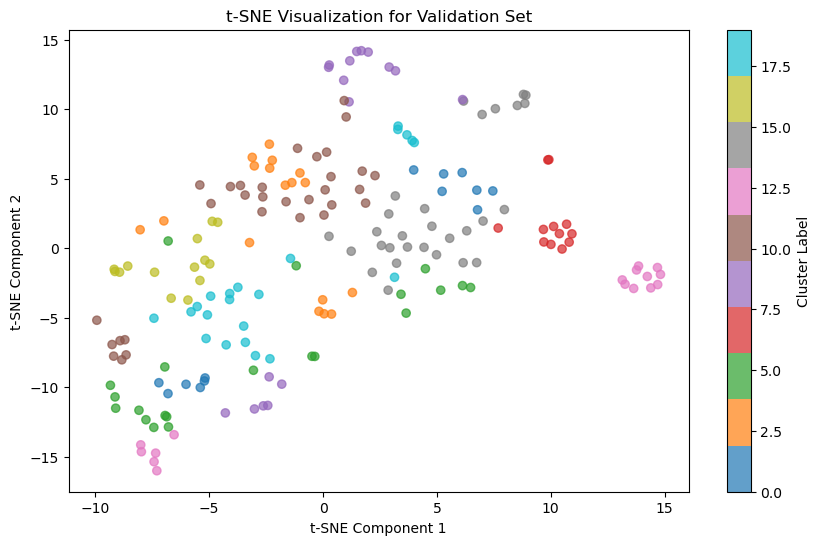

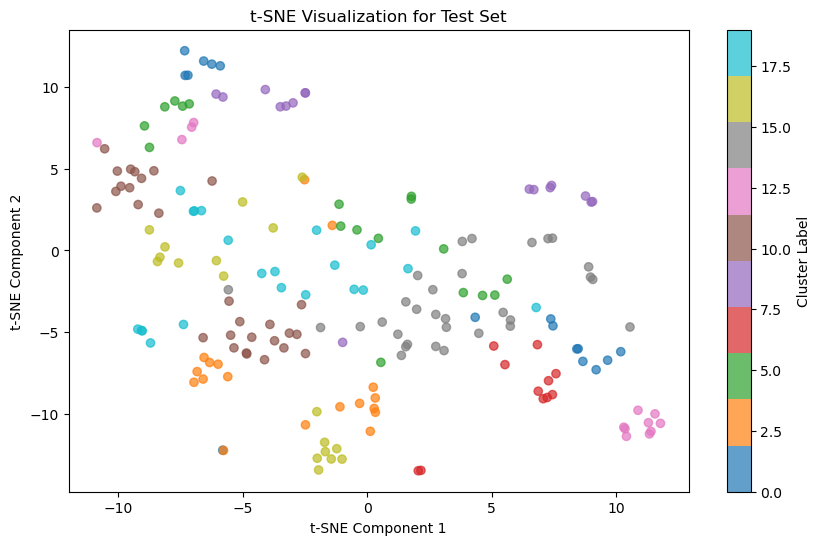

In [49]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne(embeddings, labels, title="t-SNE Visualization"):
    tsne = TSNE(n_components=2, random_state=32, perplexity=30)
    tsne_results = tsne.fit_transform(embeddings)
    
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap="tab10", alpha=0.7
    )
    plt.colorbar(scatter, label="Cluster Label")
    plt.title(title)
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.show()

val_labels = kmeans.predict(val_embeddings)
test_labels = kmeans.predict(test_embeddings)

plot_tsne(val_embeddings, val_labels, title="t-SNE Visualization for Validation Set")
plot_tsne(test_embeddings, test_labels, title="t-SNE Visualization for Test Set")
